## SYSTEM SOFTWARE CODE

In [15]:
print("hello world")

hello world


### BM3D SOTA MODEL

Running BM3D on BSDS300 for denoise
PSNR_noisy: 24.081589161816225,  PSRN_gt: 25.34543087678792
SSIM_gt: 0.6751788258552551,  SSIM_noisy: 0.612236738204956,  DSSIM: 0.3244430766847062


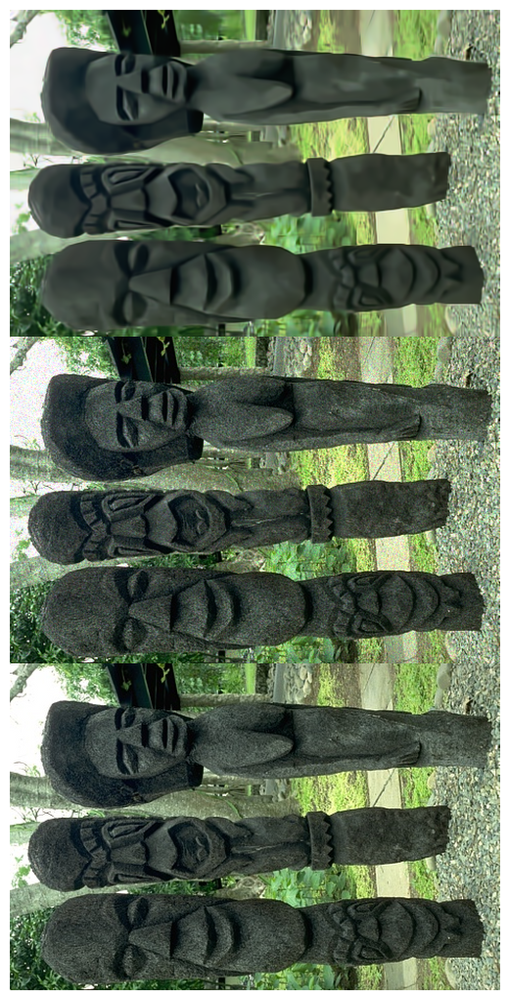

Finished running BM3D on BSDS300 for denoise


In [10]:
from run_dip_denoise_deblur import *

dataset = BSDS300Dataset(use_patches=False)

run_method(dataset, dataset_name="BSDS300", task="denoise", method="BM3D", fsavepath="../results", verbose=True, sigma=0.1)

### DIP MODEL

Running DIP on BSDS300 for denoise
Number of params: 2212671
Starting optimization with ADAM


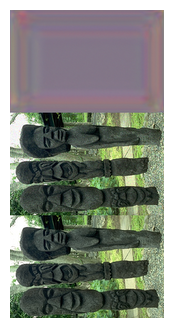

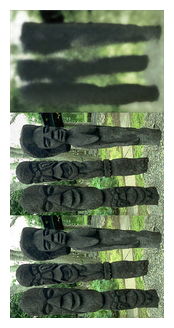

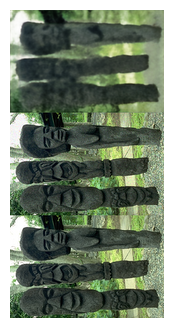

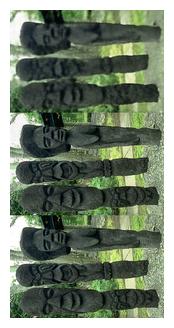

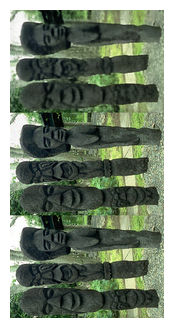

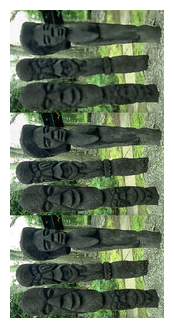

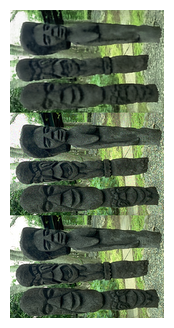

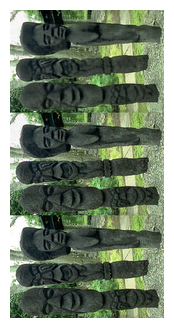

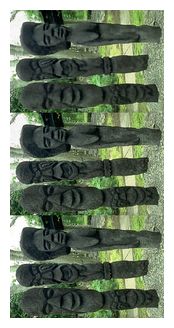

Iteration 00887  Loss 0.005937  PSNR_noisy: 22.26  PSNR_gt: 23.34  SSIM_gt: 0.6063  DSSIM: 0.2238
Early stopping at iteration 887; restoring best checkpoint from iteration 867.
Finished running DIP on BSDS300 for denoise


In [15]:
from run_dip_denoise_deblur import *

dataset = BSDS300Dataset(use_patches=False)

run_method(dataset, dataset_name="BSDS300", task="denoise", method= "DIP", fsavepath="../results", verbose=True, sigma=0.1)

### ADMM-TV MODEL

Running ADMM-DIP on BSDS300 for denoise
Number of params: 2212671


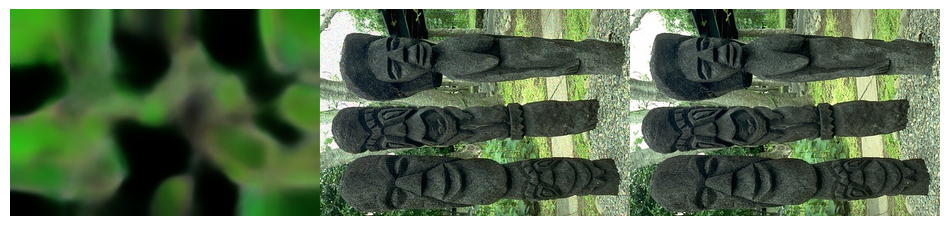

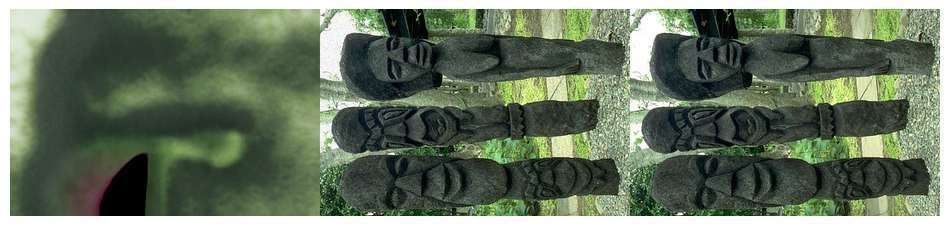

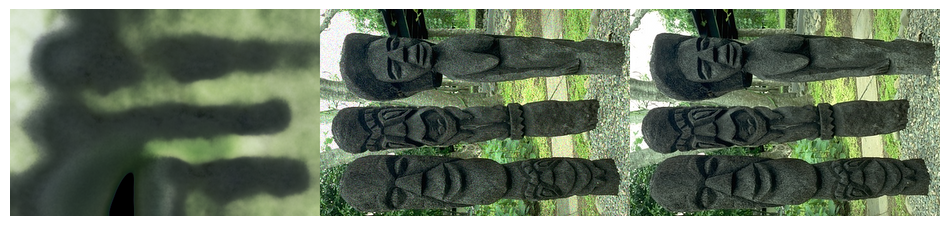

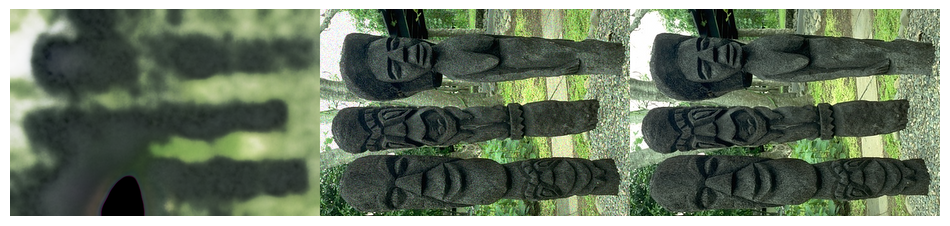

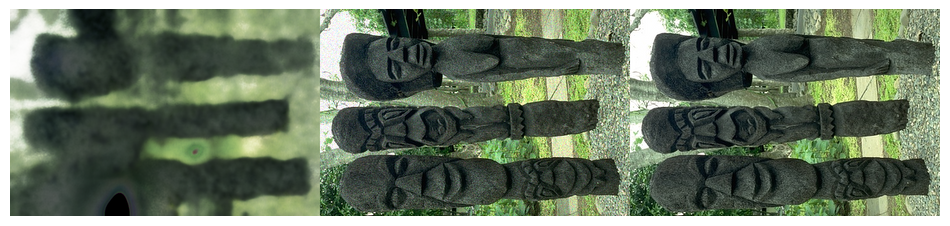

...

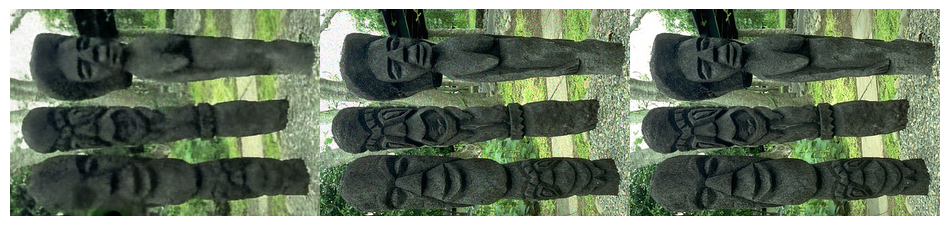

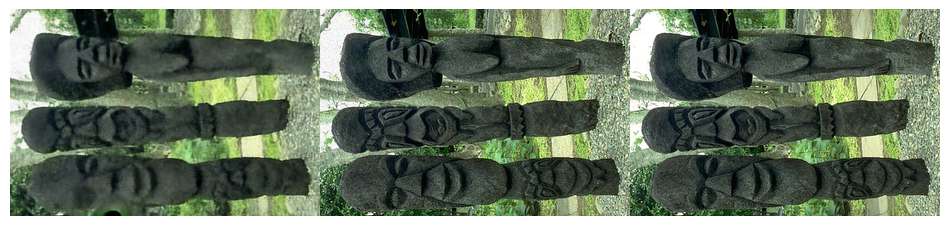

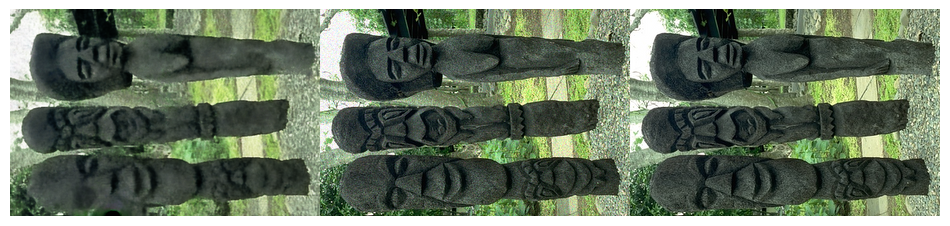

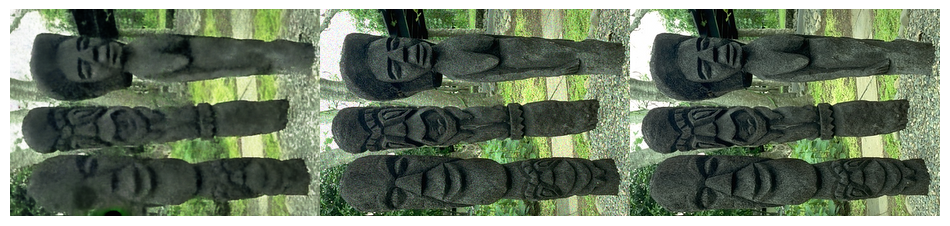

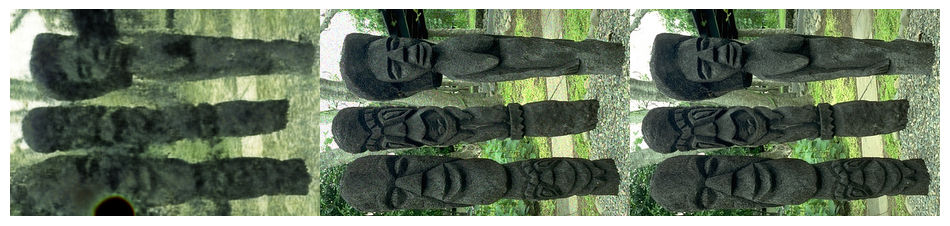

Iteration 00993    Loss 3819.402832   PSNR_noisy: 20.854855   PSRN_gt: 21.660030 
Early stopping at iteration 993; restoring best checkpoint from iteration 893 with PSNR_gt=23.361828.
Finished running ADMM-DIP on BSDS300 for denoise


In [21]:
from run_dip_denoise_deblur import *

dataset = BSDS300Dataset(use_patches=False)

run_method(dataset, dataset_name="BSDS300", task="denoise", method= "ADMM-DIP", fsavepath="../results", verbose=True, sigma=0.1)

### CUDA CUSTOM ADMM-TV MODEL

Running ADMM-DIP-CUDA on BSDS300 for denoise
ADMM image operators: loaded
Number of params: 2212671


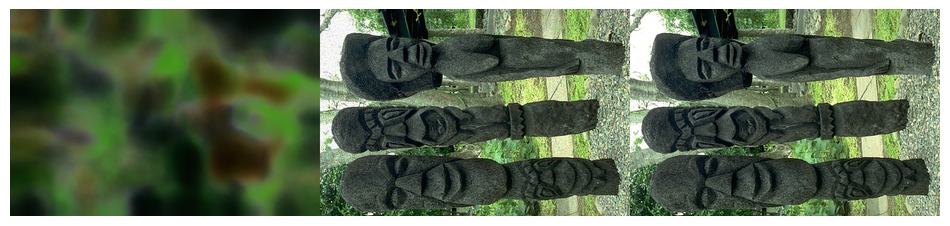

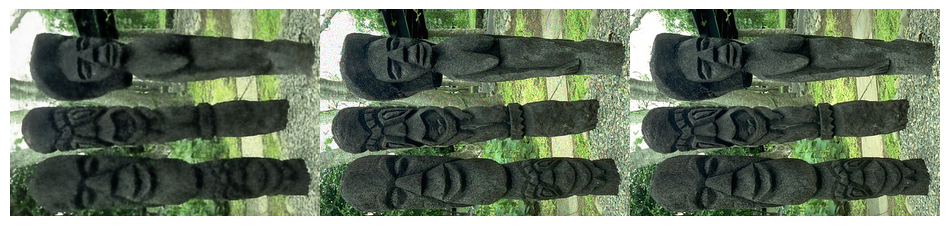

Iteration 01173    Loss 4101.348145   PSNR_noisy: 20.469476   PSRN_gt: 21.192431  
Early stopping at iteration 1173; restoring best checkpoint from iteration 1073 with PSNR_gt=23.940748.
Finished running ADMM-DIP-CUDA on BSDS300 for denoise


In [21]:
from run_dip_denoise_deblur import *

dataset = BSDS300Dataset(use_patches=False)

run_method(dataset, dataset_name="BSDS300", task="denoise", method= "ADMM-DIP-CUDA", fsavepath="../results", verbose=True, sigma=0.1)

### COMPARING TWV and TV MODELS

In [ ]:
import importlib
import run_dip_denoise_deblur as dip_runner
from IPython.display import display, Image as NotebookImage

# Reload so notebook sessions pick up the latest comparison implementation.
dip_runner = importlib.reload(dip_runner)

dataset = dip_runner.BSDS300Dataset(use_patches=False)
comparison = dip_runner.compare_admm_tv_methods(
    dataset,
    image_index=0,       # Change this to compare another dataset image.
    sigma=0.1,
    fsavepath="../results",
    verbose=False,       # Avoid intermediate plots from every iteration.
    noise_seed=1,        # Both methods receive the same noisy image.
    model_seed=1,        # Equivalent layers start from the same seed.
)

# Display the combined outputs and the metric-curve comparison.
display(NotebookImage(filename=comparison["montage_path"]))
display(NotebookImage(filename=comparison["curves_path"]))